<a href="https://colab.research.google.com/github/seifahmed2004/Real-Time-Road-Anomaly-Detection-for-Autonomous-Vehicles/blob/main/Real_Time_Road_Anomaly_Detection_for_Autonomous_Vehicles.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [81]:
import kagglehub
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras.layers import  Dense, Flatten, MaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import ModelCheckpoint

from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.image as img
import os
import numpy as np
import shutil
from tensorflow.keras.models import load_model
import random

In [13]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("atulyakumar98/pothole-detection-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/pothole-detection-dataset


In [18]:
os.listdir(path)

['normal', 'potholes']

In [27]:
train_path = os.path.join(path, 'Training')
test_path = os.path.join(path, 'Testing')

rootdir = '/content/'
classes_dir = ['potholes', 'normal']

for i in classes_dir:
    if not os.path.exists(rootdir +'/train/' + i):
        os.makedirs(rootdir +'/train/' + i)
    if not os.path.exists(rootdir +'/test/' + i):
        os.makedirs(rootdir +'/test/' + i)

    source = path + '/' + i

    allFileNames = os.listdir(source)

    np.random.shuffle(allFileNames)

    test_ratio = 0.30

    train_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                          [int(len(allFileNames)* (1 - test_ratio))])

    train_FileNames = [source+'/'+ name for name in train_FileNames.tolist()]
    test_FileNames = [source+'/' + name for name in test_FileNames.tolist()]

    for name in train_FileNames:
      shutil.copy(name, rootdir +'/train/' + i)

    for name in test_FileNames:
      shutil.copy(name, rootdir +'/test/' + i)


In [28]:
train_path = rootdir + 'train'
test_path = rootdir + 'test'

In [30]:
import matplotlib.image as img

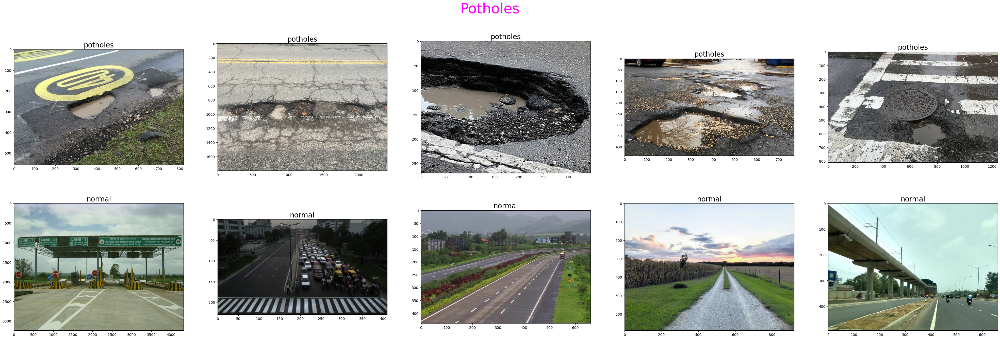

In [39]:
fig, ax = plt.subplots(2,5, figsize=(50,15))
fig.suptitle('Potholes',color='magenta',fontsize=40)
for i in range(2):
    for j in range(5):
        im_src = rootdir +'train/' + classes_dir[i] + '/'
        FileNames = os.listdir(im_src)
        np.random.shuffle(FileNames)
        im_src = str(im_src + FileNames[j])
        imag = img.imread(im_src)
        ax[i, j].imshow(imag)
        ax[i, j].set_title(classes_dir[i], fontsize=20)

In [34]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip= True,
    fill_mode='nearest')

# test Data Augmentation
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip= True,
    fill_mode='nearest')

In [35]:
train_set = train_datagen.flow_from_directory(train_path,
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'binary')
test_set = test_datagen.flow_from_directory(test_path,
                                            target_size = (224, 224),
                                            batch_size = 4,
                                            class_mode = 'binary')
no_of_validation_images = len(test_set)
validation_steps = np.ceil(no_of_validation_images)

Found 476 images belonging to 3 classes.
Found 205 images belonging to 3 classes.


In [37]:
IMAGE_SIZE = [224, 224, 3]
base_model = VGG16(input_shape=IMAGE_SIZE, weights='imagenet', include_top=False)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [41]:
base_model.trainable = False
inputs = tf.keras.Input(shape=(224, 224, 3))

In [42]:
x = base_model(inputs, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
outputs = tf.keras.layers.Dense(1, activation = 'sigmoid')(x)
model = tf.keras.Model(inputs, outputs)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,715,201 (56.13 MB)

 Trainable params: 513 (2.00 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [43]:
adam = optimizers.Adam()
model.compile(loss='binary_crossentropy',
              optimizer=adam,
              metrics=['accuracy'])

In [44]:
checkpoint = ModelCheckpoint(filepath='/content/vgg16_weights_tf_dim_ordering_tf_kernels.keras',
                               verbose=2, save_best_only=True)
callbacks = [checkpoint]
start = datetime.now()

model_history=model.fit(
                      train_set,
                      validation_data=test_set,
                      epochs=50,
                      callbacks=callbacks ,verbose=2)


duration = datetime.now() - start
print("Training completed in time: ", duration)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50

Epoch 1: val_loss improved from inf to 1.21672, saving model to /content/vgg16_weights_tf_dim_ordering_tf_kernels.keras
15/15 - 45s - 3s/step - accuracy: 0.4895 - loss: 1.5949 - val_accuracy: 0.5610 - val_loss: 1.2167
Epoch 2/50

Epoch 2: val_loss improved from 1.21672 to 0.65698, saving model to /content/vgg16_weights_tf_dim_ordering_tf_kernels.keras
15/15 - 18s - 1s/step - accuracy: 0.6513 - loss: 0.8595 - val_accuracy: 0.7220 - val_loss: 0.6570
Epoch 3/50

Epoch 3: val_loss improved from 0.65698 to 0.47370, saving model to /content/vgg16_weights_tf_dim_ordering_tf_kernels.keras
15/15 - 18s - 1s/step - accuracy: 0.7962 - loss: 0.4909 - val_accuracy: 0.8439 - val_loss: 0.4737
Epoch 4/50

Epoch 4: val_loss improved from 0.47370 to 0.35836, saving model to /content/vgg16_weights_tf_dim_ordering_tf_kernels.keras
15/15 - 19s - 1s/step - accuracy: 0.8634 - loss: 0.2958 - val_accuracy: 0.8780 - val_loss: 0.3584
Epoch 5/50

Epoch 5: val_loss improved from 0.35836 to 0.27882, savi

In [75]:
best_epoch = np.argmin(model_history.history['val_loss'])
best_val_loss = model_history.history['val_loss'][best_epoch]
best_val_acc = model_history.history['val_accuracy'][best_epoch]
best_train_loss = model_history.history['loss'][best_epoch]
best_train_acc = model_history.history['accuracy'][best_epoch]

In [76]:
print("Best Validation Loss:", best_val_loss)
print("Best Validation Accuracy:", best_val_acc)
print("Best Training Loss:", best_train_loss)
print("Best Training Accuracy:", best_train_acc)
print("Best Epoch: ",best_epoch)

Best Validation Loss: 0.06834881007671356
Best Validation Accuracy: 0.9756097793579102
Best Training Loss: 0.06391362845897675
Best Training Accuracy: 0.9726890921592712
Best Epoch:  32


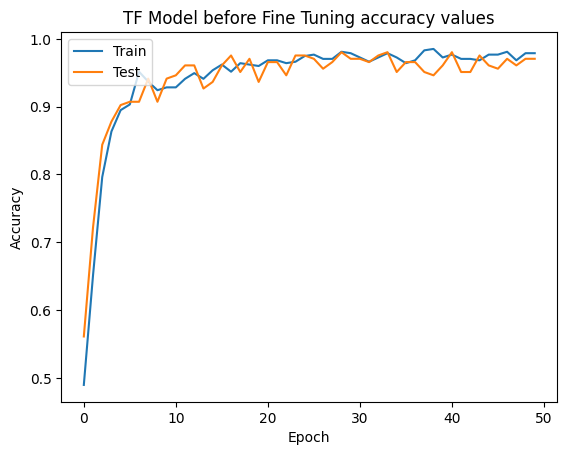

In [45]:
# Plot training & validation loss values
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

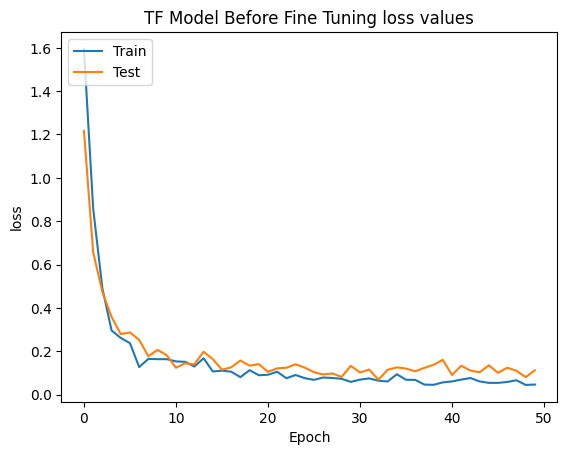

In [46]:
# Plot training & validation loss values
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [91]:
def process_images(image_folder, num_images=30):
    all_image_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder)
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    selected_image_paths = random.sample(all_image_paths, min(num_images, len(all_image_paths)))

    plt.figure(figsize=(15, 20))
    results = []

    for idx, img_path in enumerate(selected_image_paths, 1):
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)
        prediction = model.predict(img_array, verbose=0)
        probability = prediction[0][0]
        results.append((img_path, probability))

        img_display = cv2.imread(img_path)
        img_display = cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB)

        plt.subplot(10, 3, idx)
        plt.imshow(img_display)

        label = "Pothole" if probability > 0.5 else "Normal"
        color = "red" if label == "Pothole" else "green"
        plt.title(f"{label} ({probability:.2f})", color=color)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    pothole_count = sum(1 for _, prob in results if prob > 0.5)
    print(f"\nResults Summary:")
    print(f"Total images processed: {len(results)}")
    print(f"Potholes detected: {pothole_count}")
    print(f"Normal roads: {len(results)-pothole_count}")
    print(f"Detection rate: {pothole_count/len(results):.1%}")

    return results

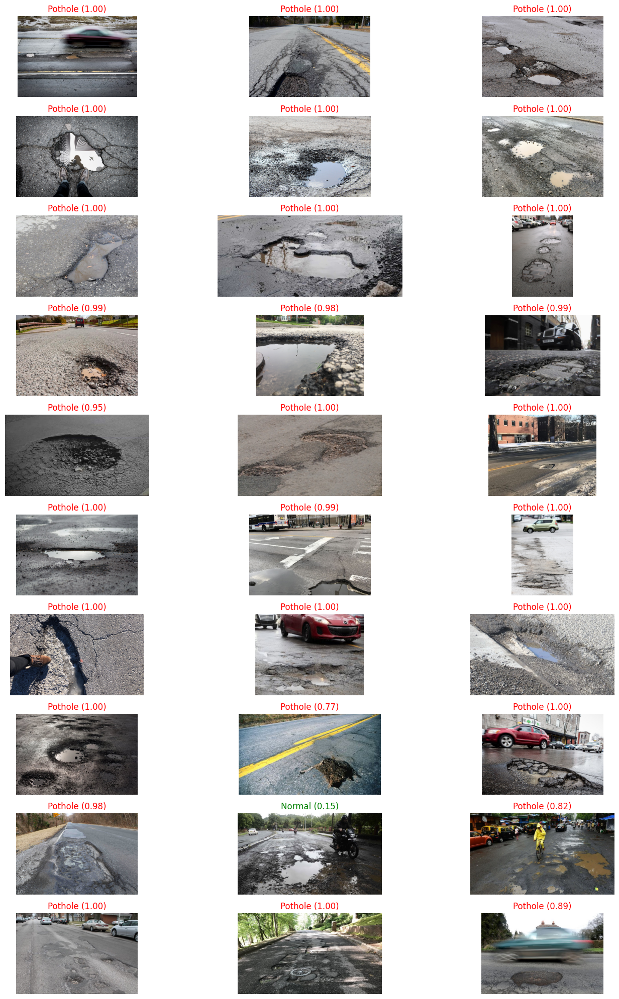


Results Summary:
Total images processed: 30
Potholes detected: 29
Normal roads: 1
Detection rate: 96.7%


In [92]:
image_folder = '/content/test/potholes'
results = process_images(image_folder, num_images=30)